In [142]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
import itertools
import seaborn as sns
import numpy as np
import os
from itertools import combinations
from scipy.stats import spearmanr
import re

In [143]:
path = 'D:\\gecco2024\\Results'
#file_name=LSHADE_{correction_name}_f{function_id}_D20_mean_values.csv 
correction_names=['sat','midT','midB','unif','beta','mir','tor','expC_R','expC_T','expC_B','vectR','vectT','vectB', 'mahalanobis' ]
metrics = ['it', 'pop_size', 'best', 'error', 'prob_infeas', 'genMutatedComponent', 'genSuccessMutants',
                                    'meanImprovements', 'varPop', 'avgF', 'avgCR', 'extension', 'shape', 'eccentricity',
                                    'kl_unif']
function_identifiers=['3', '4', '5', '16', '23']

In [144]:
correction_names=['sat','midT','midB','unif','beta','mir','tor','expC_R','expC_T','expC_B','vectR','vectT','vectB', 'mahalanobis' ]
rgb_colours_255 = [
    (51, 102, 204),   # Prussian Blue for Sat
    (136, 179, 88),   # Dark Lime for midT
    (31, 23, 146),    # Dark Blue for midB
    (0, 128, 0),      # Green for Uniform
    (230, 25, 75),    # Red for Beta
    (245, 130, 48),   # Orange for mir
    (0, 128, 128),    # Orange for tor
    (240, 230, 140),  # Yellow for expC_R
    (128, 128, 128),  # Grey for expC_T
    (0, 204, 204),    # Light Blue for expC_B
    (135, 72, 8),     # Dark Brown for vectR
    (168, 106, 195),  # Purple for vectT
    (255, 152, 225),  # Pink for vectB
    (195, 148, 106)   # Brown for Mahalanobis
]
rgb_colours = [(r / 255.0, g / 255.0, b / 255.0) for r, g, b in rgb_colours_255]

assert len(rgb_colours) >= len(correction_names), "Nu sunt destule culori"

colour_mapping = {f'LSHADE_{corr}': rgb_colours[i] for i, corr in enumerate(correction_names)}

In [145]:
def build_data_structure_ratio(path, correction_names, function_identifiers, metrics):
    data_structure = {}
    for f in function_identifiers:
        data_structure[f] = {metric: {} for metric in metrics}
        data_structure[f]['ratio'] = {}        
        for correction_name in correction_names:
            file_name = f"{path}\\LSHADE_{correction_name}_f{f}_D20_mean_values.csv"
            try:
                data = pd.read_csv(file_name)
                if 'genSuccessMutants' in data.columns and 'pop_size' in data.columns:
                    data['ratio'] = data['genSuccessMutants'] / data['pop_size']                
                for column in metrics + ['ratio']: 
                    if column in data.columns:
                        data_structure[f][column][correction_name] = data[column].tolist()
            except FileNotFoundError:
                print(f"File not found: {file_name}")
                continue 
                
    return data_structure

In [146]:
data_structure_ratio = build_data_structure_ratio(path, correction_names, function_identifiers, metrics)

In [147]:
def plot_prob_infeas(data_structure, function_ids, correction_names, metric):
    plt.figure(figsize=(10, 5 * len(function_ids)))

    for i, function_id in enumerate(function_ids, start=1):
        plt.subplot(len(function_ids), 1, i)
        for correction_name in correction_names:
            # Accessing the list of iterations
            iterations = data_structure[function_id]['it'][correction_name]
            # print(len(iterations))
            # Accessing the list of 'prob_infeas' values
            prob_infeas_values = data_structure[function_id][metric][correction_name]
            colour = colour_mapping.get(f'LSHADE_{correction_name}', (0, 0, 0))
            plt.plot(iterations, prob_infeas_values, label=correction_name, color=colour)
        
        plt.title(f'Evolution of {metric} for function f{function_id}')
        plt.xlabel('Iteration')
        plt.ylabel(metric)
        plt.grid(False)
        plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

    plt.tight_layout()
    plot_path = os.path.join(path, f'NEW_MAY\\Plot_{metric}_all_iterations.png')
    plt.show()
    # plt.savefig(plot_path)    
    # plt.close()

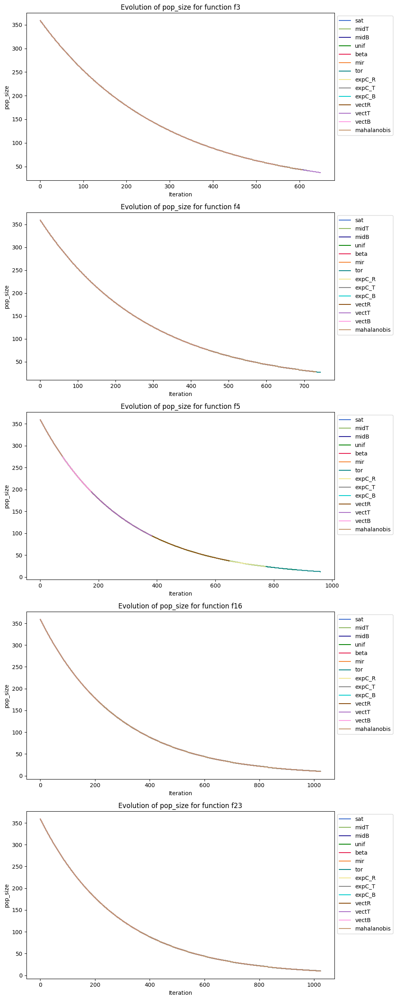

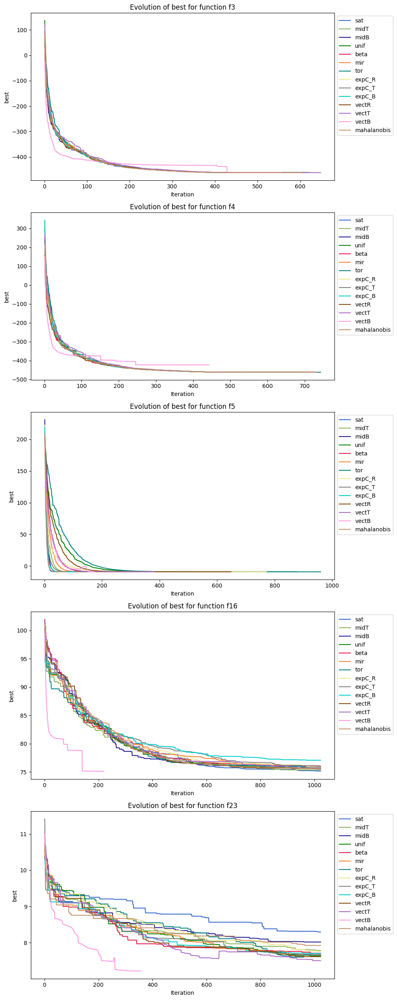

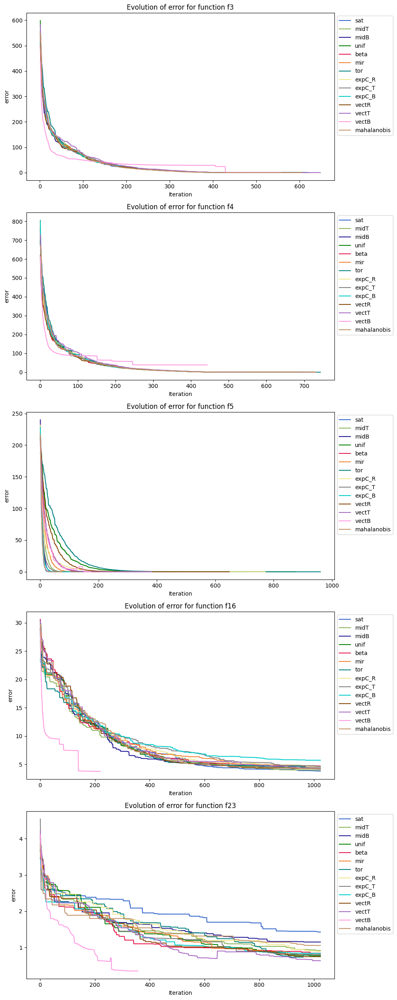

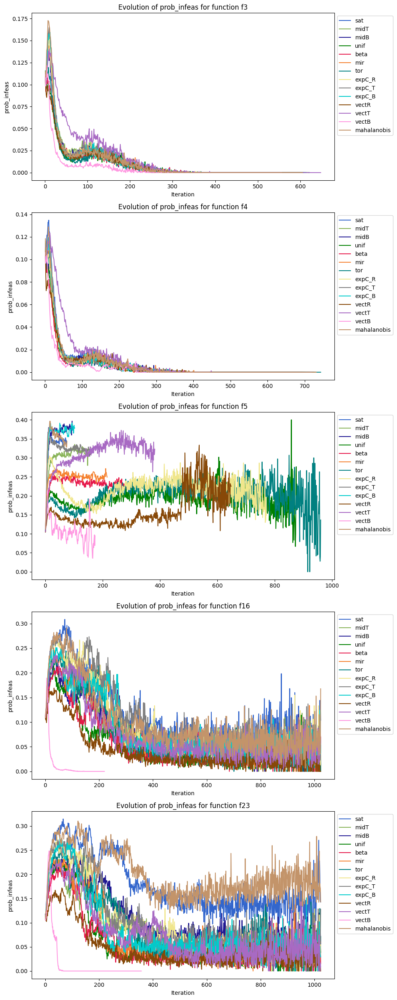

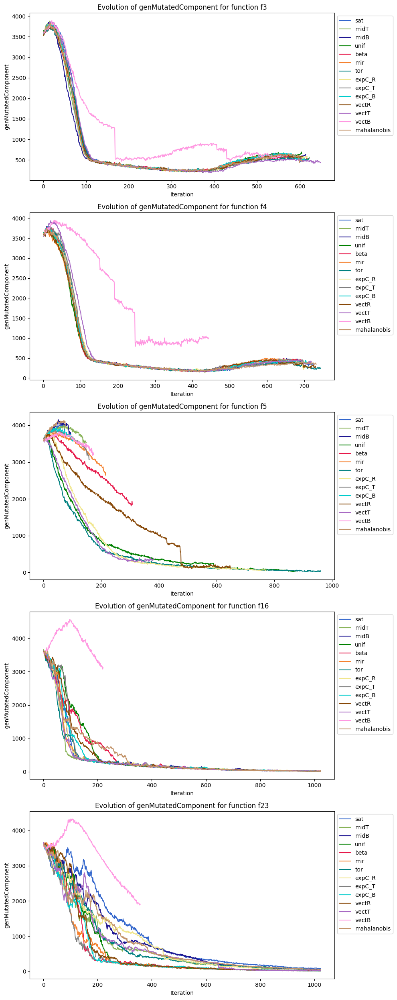

...

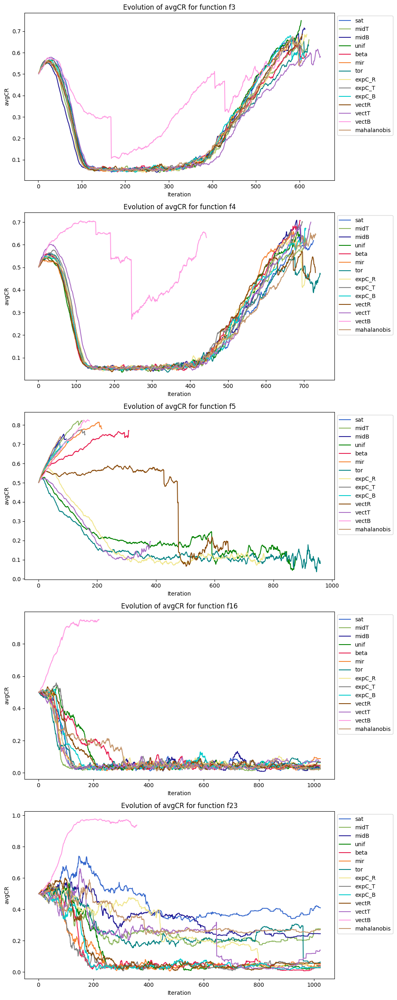

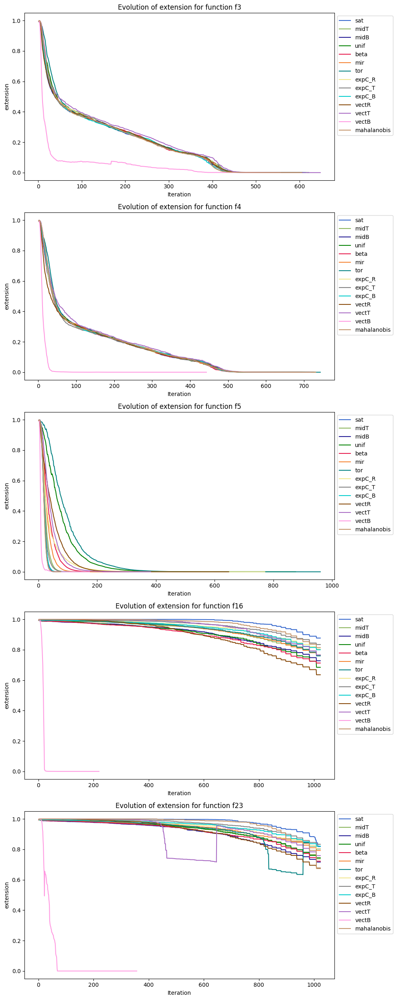

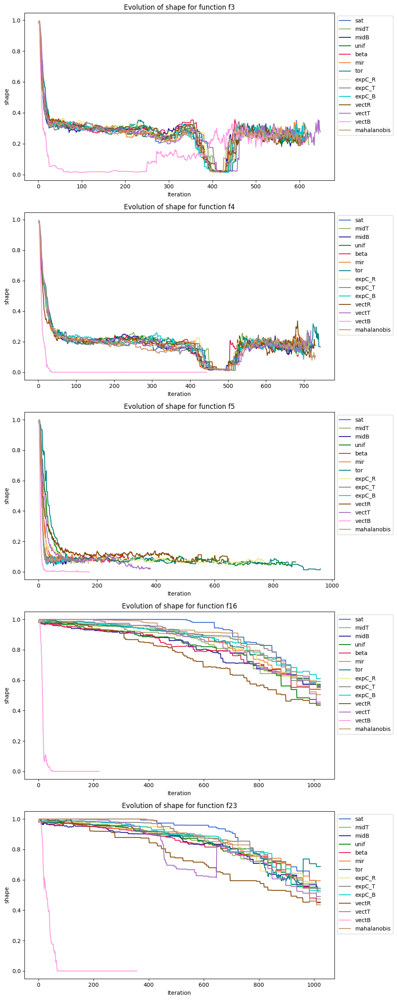

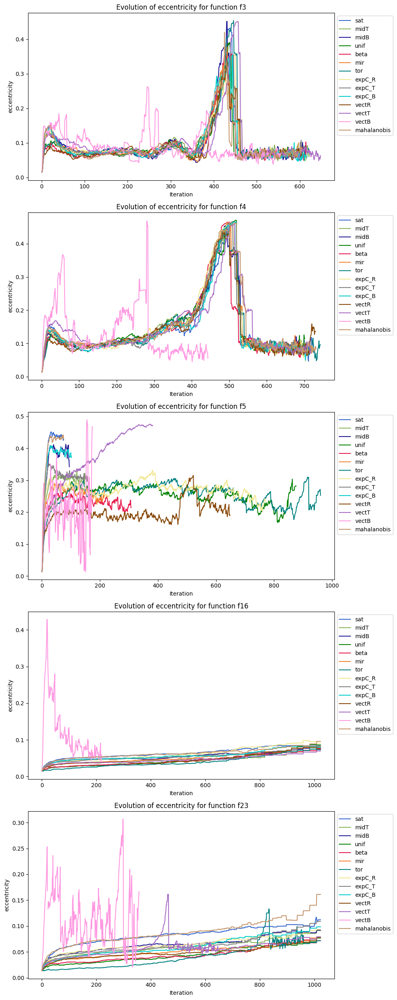

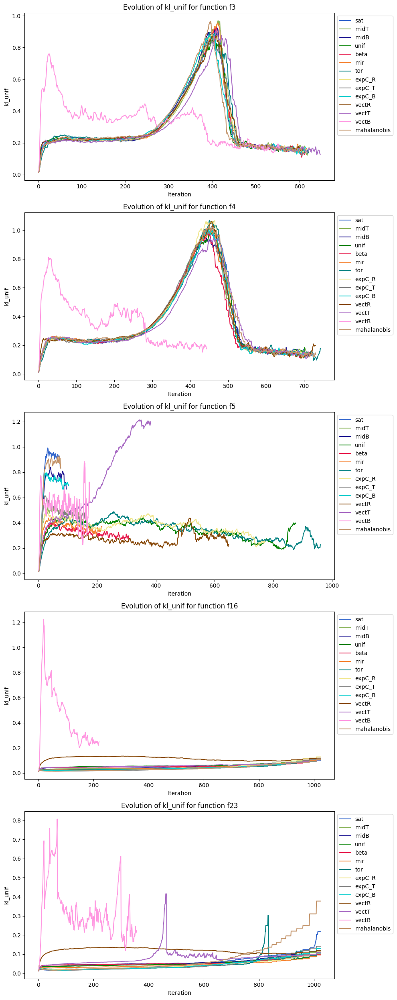

In [148]:
new_metrics = ['pop_size', 'best', 'error', 'prob_infeas', 'genMutatedComponent', 'genSuccessMutants',
                                    'meanImprovements', 'varPop', 'avgF', 'avgCR', 'extension', 'shape', 'eccentricity',
                                    'kl_unif']

for metric in new_metrics:
    plot_prob_infeas(data_structure_ratio, function_identifiers, correction_names, metric=metric)

In [149]:
def plot_correlation_heatmaps(data_structure, metric_pairs, key_name, function_ids):
    # Set up the matplotlib figure with subplots
    num_functions = len(function_ids)
    fig, axes = plt.subplots(num_functions, 1, figsize=(10, num_functions * 5))

    for i, f in enumerate(function_ids):
        metrics_data = data_structure[f]
        correlation_data = {}
        for (metric1, metric2) in metric_pairs:
            correlation_data[f'{metric1}_vs_{metric2}'] = []
            for correction_name in correction_names:
                values1 = metrics_data.get(metric1, {}).get(correction_name, [])
                values2 = metrics_data.get(metric2, {}).get(correction_name, [])   
                correlation = pd.Series(values1).corr(pd.Series(values2), method='spearman')                    
                correlation_data[f'{metric1}_vs_{metric2}'].append(correlation)

        # Generate the heatmap for the current function
        heatmap_df = pd.DataFrame(correlation_data, index=correction_names)
        if num_functions > 1:
            ax = axes[i]
        else:
            ax = axes
        sns.heatmap(heatmap_df.T, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1, ax=ax)
        ax.set_title(f'Function f{f}')
        ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
    
    plt.tight_layout()  
    heatmap_path = os.path.join(path, f'Heatmap_{key_name}_correlation_all_it.png')
    # plt.savefig(heatmap_path)    
    # plt.close()
    plt.show()
    # print(f'Combined heatmap saved: {heatmap_path}')

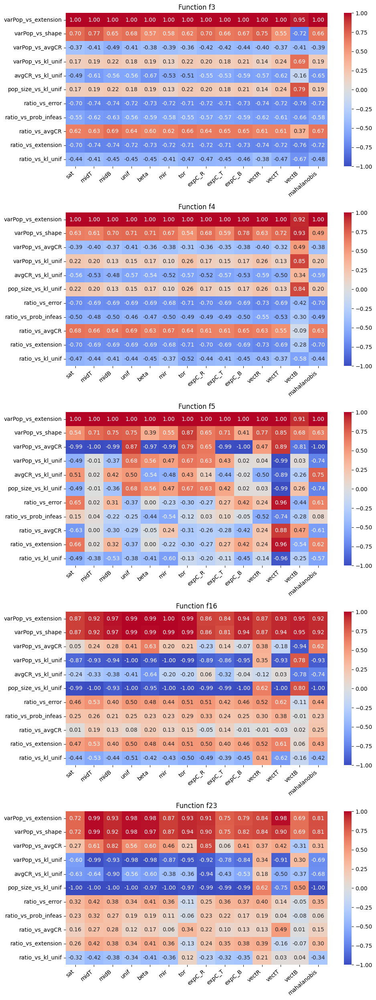

In [150]:
metric_pairs =[
 # ('error', 'prob_infeas'),
 # ('error', 'varPop'),
 # ('error', 'extension'),
 # ('error', 'shape'),
 # ('error', 'eccentricity'),
 # ('error', 'avgCR'),
 # ('prob_infeas', 'varPop'),
 # ('prob_infeas', 'avgF'),
 # ('prob_infeas', 'avgCR'),
 # ('prob_infeas', 'extension'),
 # ('prob_infeas', 'shape'),
 ('varPop', 'extension'),
 ('varPop', 'shape'),
 ('varPop', 'avgCR'),
 ('varPop', 'kl_unif'),
 ('avgCR', 'kl_unif'), 
 ('pop_size', 'kl_unif'),
 ('ratio', 'error'),
 ('ratio', 'prob_infeas'),
 ('ratio', 'avgCR'),
 ('ratio', 'extension'),
('ratio', 'kl_unif')     
]

plot_correlation_heatmaps(data_structure_ratio, metric_pairs, 'pb_err_actual',function_identifiers)


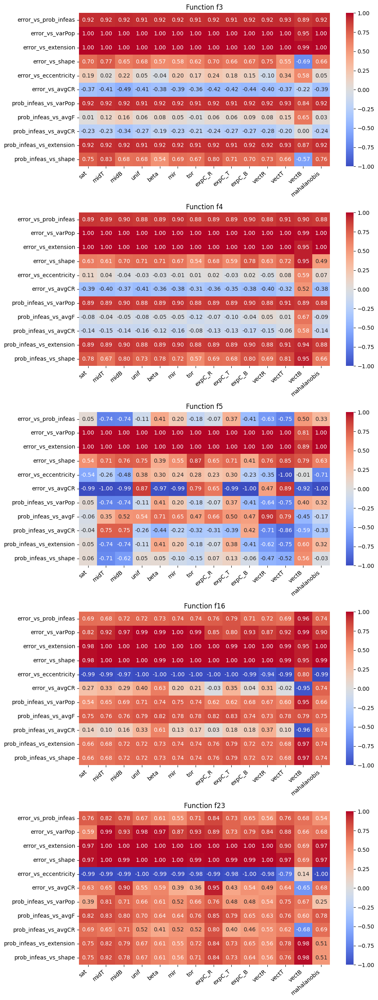

In [151]:
metric_pairs =[
 ('error', 'prob_infeas'),
 ('error', 'varPop'),
 ('error', 'extension'),
 ('error', 'shape'),
 ('error', 'eccentricity'),
 ('error', 'avgCR'),
 ('prob_infeas', 'varPop'),
 ('prob_infeas', 'avgF'),
 ('prob_infeas', 'avgCR'),
 ('prob_infeas', 'extension'),
 ('prob_infeas', 'shape')
#  ('varPop', 'extension'),
#  ('varPop', 'shape'),
#  ('varPop', 'avgCR'),
#  ('varPop', 'kl_unif'),
#  ('avgCR', 'kl_unif'), 
#  ('pop_size', 'kl_unif'),
#  ('ratio', 'error'),
#  ('ratio', 'prob_infeas'),
#  ('ratio', 'avgCR'),
#  ('ratio', 'extension'),
# ('ratio', 'kl_unif')     
]

plot_correlation_heatmaps(data_structure_ratio, metric_pairs, 'ratio',function_identifiers)

In [152]:
def plot_correlation_heatmaps_difference_series(data_structure, metric_pairs, key_name, function_ids):
    # Set up the matplotlib figure with subplots
    num_functions = len(function_ids)
    fig, axes = plt.subplots(num_functions, 1, figsize=(10, num_functions * 5))
    
    for i, f in enumerate(function_ids):
        metrics_data = data_structure[f]
        correlation_data = {}
        
        for (metric1, metric2) in metric_pairs:
            correlation_data[f'{metric1}_vs_{metric2}'] = []
            
            for correction_name in correction_names:
                values1 = metrics_data.get(metric1, {}).get(correction_name, [])
                values2 = metrics_data.get(metric2, {}).get(correction_name, [])
                
                # Calculate the differences between consecutive elements
                values1d = [values1[i] - values1[i-1] for i in range(1, len(values1))]
                values2d = [values2[i] - values2[i-1] for i in range(1, len(values2))]
                
                correlation = pd.Series(values1d).corr(pd.Series(values2d), method='spearman')
                correlation_data[f'{metric1}_vs_{metric2}'].append(correlation)
        
        # Generate the heatmap for the current function
        heatmap_df = pd.DataFrame(correlation_data, index=correction_names)
        
        if num_functions > 1:
            ax = axes[i]
        else:
            ax = axes
        
        sns.heatmap(heatmap_df.T, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1, ax=ax)
        ax.set_title(f'Function f{f}')
        ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
    
    plt.tight_layout()
    heatmap_path = os.path.join(path, f'Difference_based_series_Heatmap_{key_name}_correlation_all_it.png')
    plt.savefig(heatmap_path)
    # plt.close()
    plt.show()
    # print(f'Combined heatmap saved: {heatmap_path}')

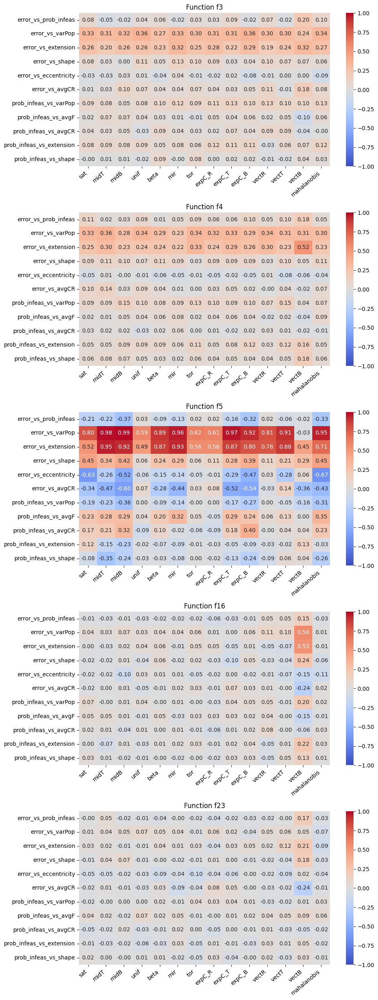

In [153]:
metric_pairs =[
 ('error', 'prob_infeas'),
 ('error', 'varPop'),
 ('error', 'extension'),
 ('error', 'shape'),
 ('error', 'eccentricity'),
 ('error', 'avgCR'),
 ('prob_infeas', 'varPop'),
 ('prob_infeas', 'avgF'),
 ('prob_infeas', 'avgCR'),
 ('prob_infeas', 'extension'),
 ('prob_infeas', 'shape')
#  ('varPop', 'extension'),
#  ('varPop', 'shape'),
#  ('varPop', 'avgCR'),
#  ('varPop', 'kl_unif'),
#  ('avgCR', 'kl_unif'), 
#  ('pop_size', 'kl_unif'),
#  ('ratio', 'error'),
#  ('ratio', 'prob_infeas'),
#  ('ratio', 'avgCR'),
#  ('ratio', 'extension'),
# ('ratio', 'kl_unif')     
]

plot_correlation_heatmaps_difference_series(data_structure_ratio, metric_pairs, 'pb_err_actual',function_identifiers)

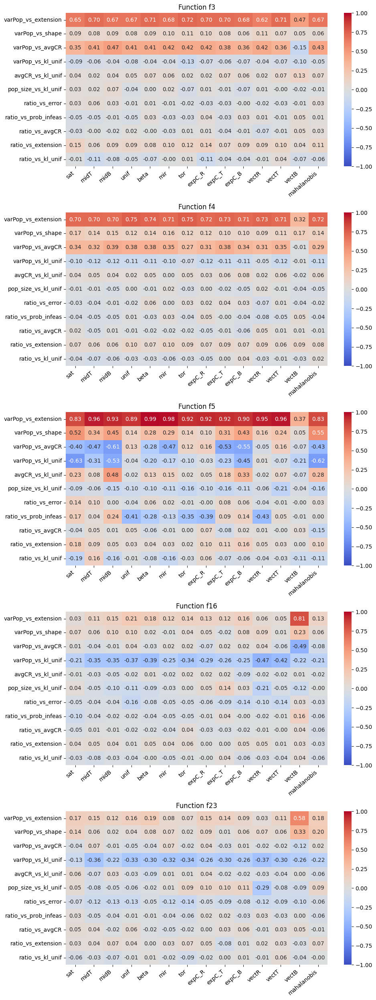

In [154]:
metric_pairs =[
 # ('error', 'prob_infeas'),
 # ('error', 'varPop'),
 # ('error', 'extension'),
 # ('error', 'shape'),
 # ('error', 'eccentricity'),
 # ('error', 'avgCR'),
 # ('prob_infeas', 'varPop'),
 # ('prob_infeas', 'avgF'),
 # ('prob_infeas', 'avgCR'),
 # ('prob_infeas', 'extension'),
 # ('prob_infeas', 'shape')
 ('varPop', 'extension'),
 ('varPop', 'shape'),
 ('varPop', 'avgCR'),
 ('varPop', 'kl_unif'),
 ('avgCR', 'kl_unif'), 
 ('pop_size', 'kl_unif'),
 ('ratio', 'error'),
 ('ratio', 'prob_infeas'),
 ('ratio', 'avgCR'),
 ('ratio', 'extension'),
('ratio', 'kl_unif')     
]

plot_correlation_heatmaps_difference_series(data_structure_ratio, metric_pairs, 'ratio',function_identifiers)

In [155]:
def extract_last_values_to_csv(path, correction_names, function_identifiers):
    error_data = {f'f{f}': {} for f in function_identifiers}
    varPop_data = {f'f{f}': {} for f in function_identifiers}
    it_data = {f'f{f}': {} for f in function_identifiers}

    for f in function_identifiers:
        for correction_name in correction_names:
            file_name = f"{path}\\LSHADE_{correction_name}_f{f}_D20_mean_values.csv"
            try:
                data = pd.read_csv(file_name)
                last_row = data.iloc[-1]
                error_data[f'f{f}'][f'LSHADE_{correction_name}'] = last_row['error']
                varPop_data[f'f{f}'][f'LSHADE_{correction_name}'] = last_row['varPop']
                it_data[f'f{f}'][f'LSHADE_{correction_name}'] = last_row['it']
            except FileNotFoundError:
                print(f"File not found: {file_name}")
                continue
    error_df = pd.DataFrame.from_dict(error_data, orient='index').transpose()
    varPop_df = pd.DataFrame.from_dict(varPop_data, orient='index').transpose()
    it_df = pd.DataFrame.from_dict(it_data, orient='index').transpose()
    with open(f"{path}\\summary_tables.csv", 'w', newline='') as file:
        file.write('Error Values\n')
        error_df.to_csv(file)
        file.write('\nVarPop Values\n')
        varPop_df.to_csv(file)
        file.write('\nIt Values\n')
        it_df.to_csv(file)
    
    print("Summary tables saved to summary_tables.csv")

In [156]:
extract_last_values_to_csv(path, correction_names, function_identifiers)

PermissionError: [Errno 13] Permission denied: 'D:\\gecco2024\\Results\\summary_tables.csv'